In [4]:
#Imports
import cv2
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd

In [5]:
#Pegando dado da trajetoria real do objeto
poses = pd.read_csv('C:/Users/maely/Downloads/data_odometry_poses/dataset/poses/01.txt', delimiter=' ', header=None)
gt = np.zeros((len(poses), 3, 4))
for i in range(len(poses)):
    gt[i] = np.array(poses.iloc[i]).reshape((3, 4))
    
gt[1].dot(np.array([0,0,0,1]))

array([ 0.05154656, -0.02424883,  1.000725  ])

<IPython.core.display.Javascript object>


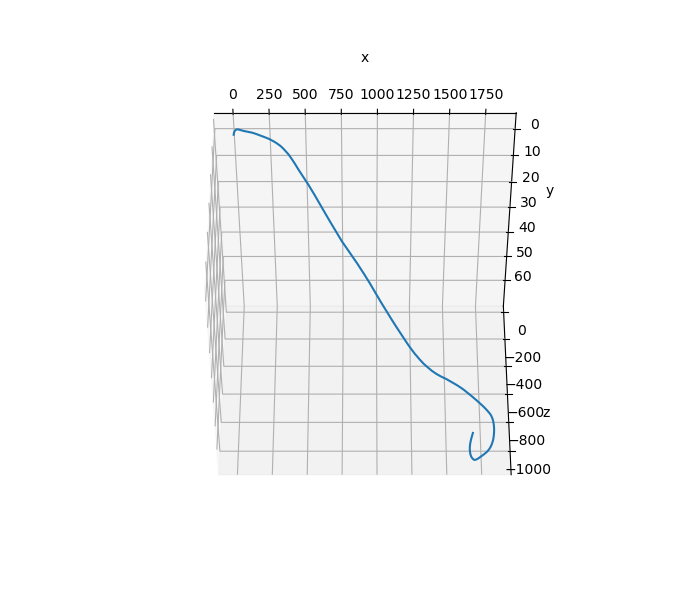

In [6]:
#Mostrando Trajetoria real
%matplotlib notebook
fig = plt.figure(figsize=(7,6))
ax = fig.add_subplot(111, projection='3d')
ax.plot(gt[:, :, 3][:, 0], gt[:, :, 3][:, 1], gt[:, :, 3][:, 2])
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')
ax.view_init(elev=-40, azim=270)

In [20]:
color = (255, 0, 0)
# # Normalizando
def norm(dst,dst_boxes):
    dst_norm = np.empty(dst.shape, dtype=np.float32)
    cv2.normalize(dst, dst_norm, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX)
    dst_norm_scaled = cv2.convertScaleAbs(dst_norm)

    # Desenhando circulo em volta dos corners
    for i in range(dst_norm.shape[0]):
        for j in range(dst_norm.shape[1]):
            if int(dst_norm[i,j]) > thresh:
                dst_boxes.append((j-1,i-1, j+1,i+1))
                cv2.rectangle(dst_norm_scaled, (j-1,i-1), (j+1,i+1), color, 2)
               
    return dst_norm_scaled
    


In [59]:
#Filtrando (Usando non-max suppression)

#5X5

#5000 para 10X10 

def non_max(boxes, overlapThresh):

   
    if len(boxes) == 0:
        return []

    if boxes.dtype.kind == "i":
        boxes = boxes.astype("float")

    pick = []

    x1 = boxes[:,0]
    y1 = boxes[:,1]
    x2 = boxes[:,2]
    y2 = boxes[:,3]

    area = (x2 - x1 + 1) * (y2 - y1 + 1)
    idxs = np.argsort(y2)

    while len(idxs) > 0:
        last = len(idxs) - 1
        i = idxs[last]
        pick.append(i)
        xx1 = np.maximum(x1[i], x1[idxs[:last]])
        yy1 = np.maximum(y1[i], y1[idxs[:last]])
        xx2 = np.minimum(x2[i], x2[idxs[:last]])
        yy2 = np.minimum(y2[i], y2[idxs[:last]])

        w = np.maximum(0, xx2 - xx1 + 1)
        h = np.maximum(0, yy2 - yy1 + 1)
        overlap = (w * h) / area[idxs[:last]]
        idxs = np.delete(idxs, np.concatenate(([last],
            np.where(overlap > overlapThresh)[0])))

    return np.array(pick)


In [45]:

def norm2(dst):
    dst_norm = np.empty(dst.shape, dtype=np.float32)
    cv2.normalize(dst, dst_norm, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX)
    dst_norm_scaled = cv2.convertScaleAbs(dst_norm)
              
    return dst_norm_scaled
  



def pickBoxes(pick, imagFilter):
    for (startX, startY, endX, endY) in pick:
        cv2.rectangle(imagFilter, (startX, startY), (endX, endY), (0, 255, 0), 2)
    return imagFilter


C:\Users\maely\AppData\Local\Temp/ipykernel_11180/4212859066.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(12,6))


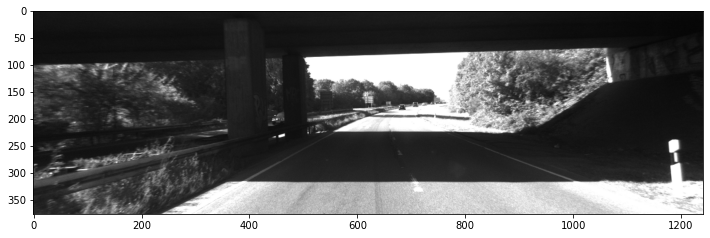

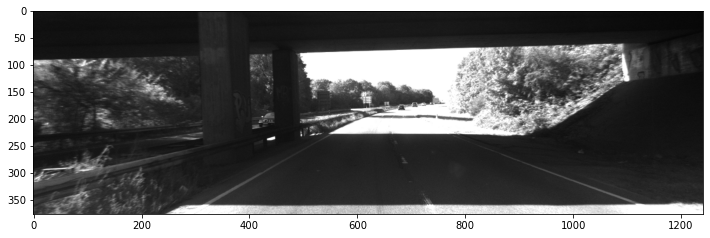

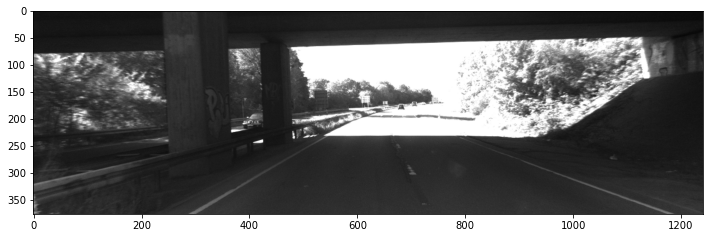

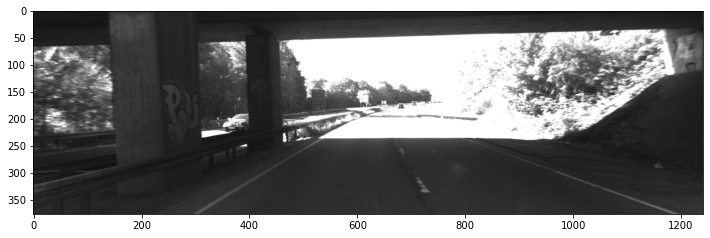

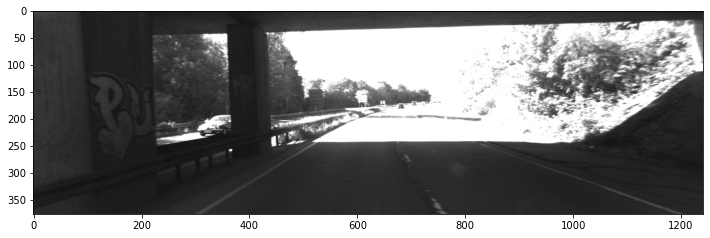

...

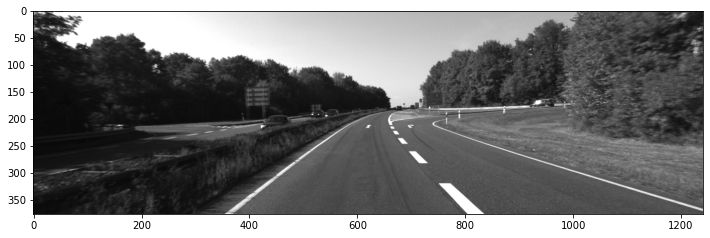

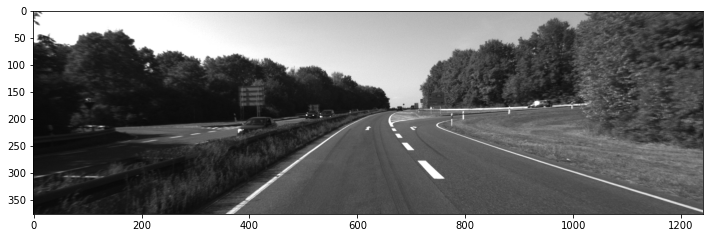

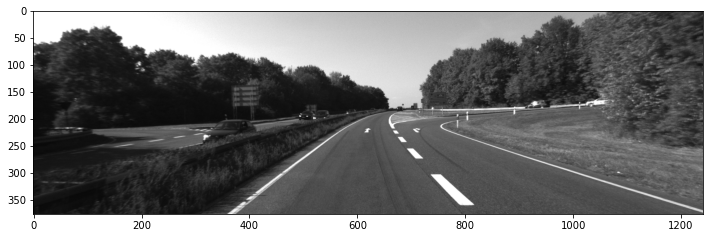

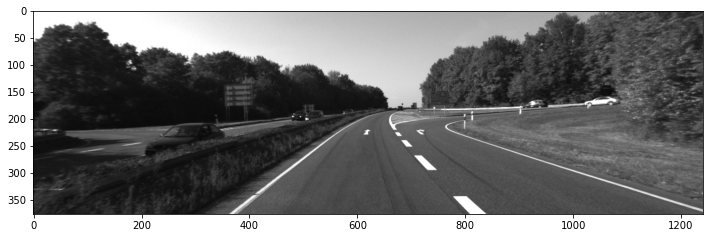

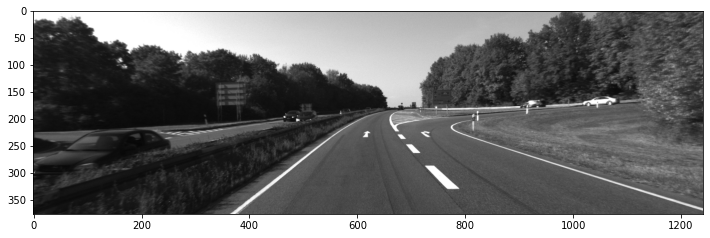

In [11]:
%matplotlib inline
for i in range(100,150):
    test_img = cv2.imread('C:/Users/maely/Downloads/data_odometry_gray/dataset/sequences/01/image_0/000'+str(i)+'.png')
    plt.figure(figsize=(12,6))
    plt.imshow(test_img)

C:\Users\maely\AppData\Local\Temp/ipykernel_11180/3548980347.py:12: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(12,6))


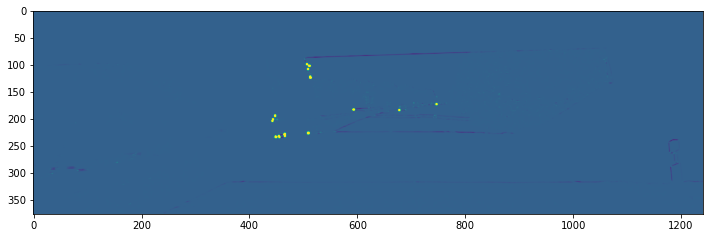

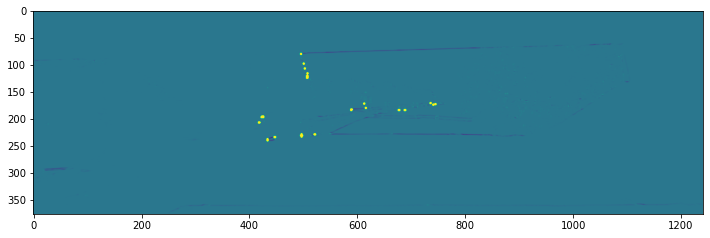

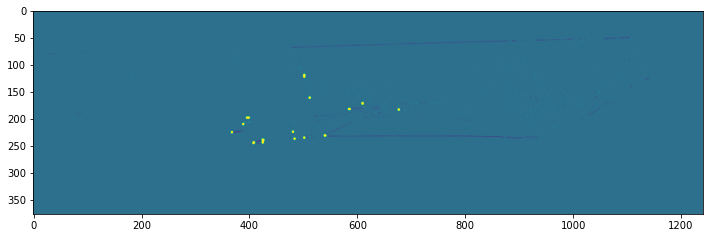

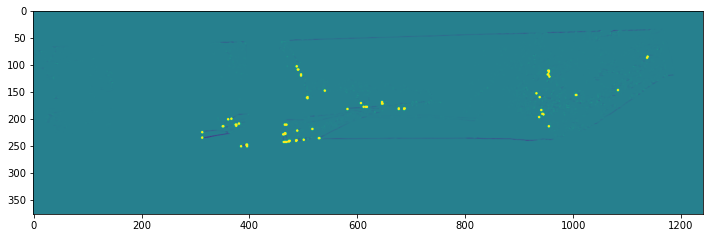

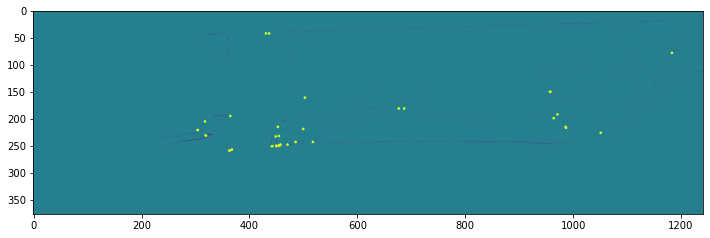

...

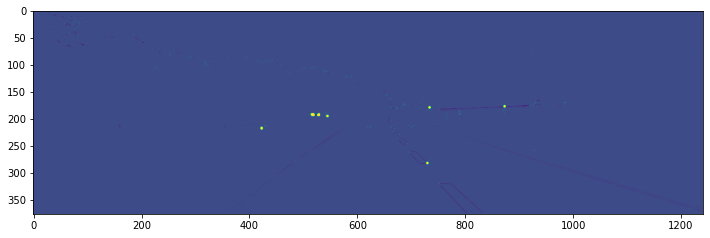

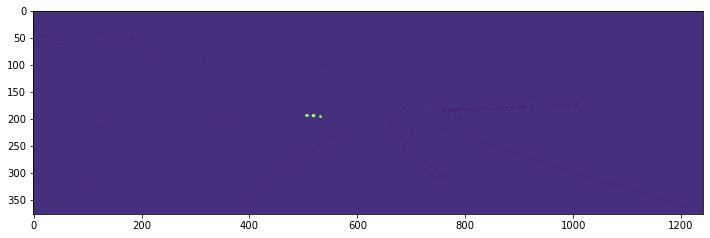

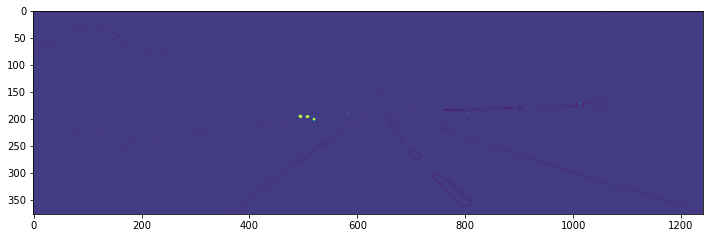

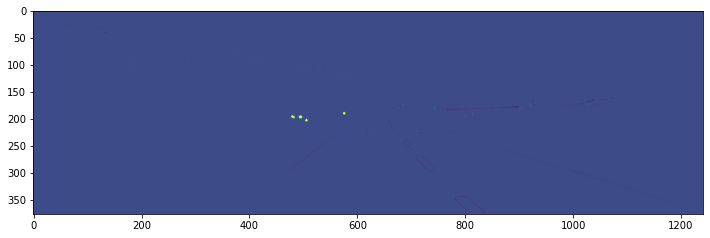

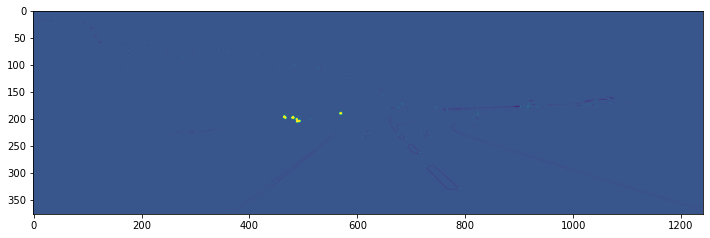

In [57]:

blockSize = 2
apertureSize = 3
a = 0.04


for i in range(100,150):
    img = cv2.imread('C:/Users/maely/Downloads/data_odometry_gray/dataset/sequences/01/image_0/000'+str(i)+'.png')
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) 
    dst = cv2.cornerHarris(img, 2, 3, 0.04)
    dst_boxes=[]
    imagNorm = norm(dst,dst_boxes)
    plt.figure(figsize=(12,6))
    plt.imshow(imagNorm)

C:\Users\maely\AppData\Local\Temp/ipykernel_11180/3480133582.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(12,6))


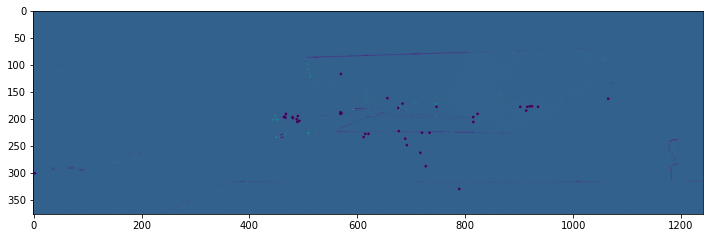

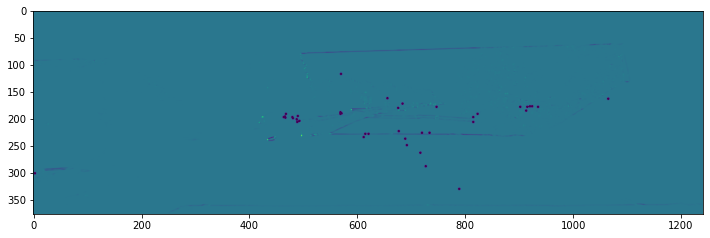

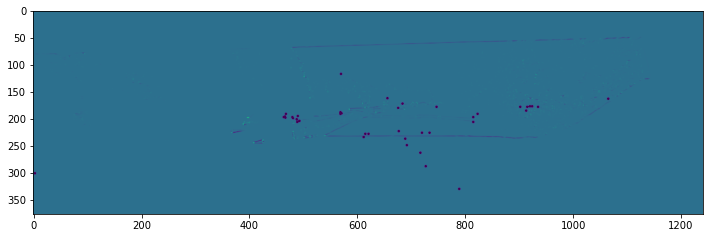

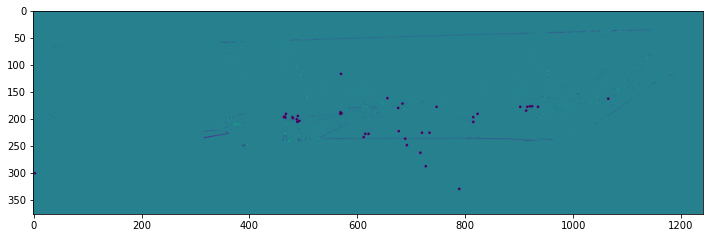

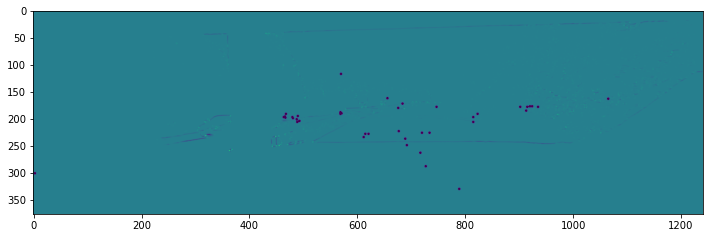

...

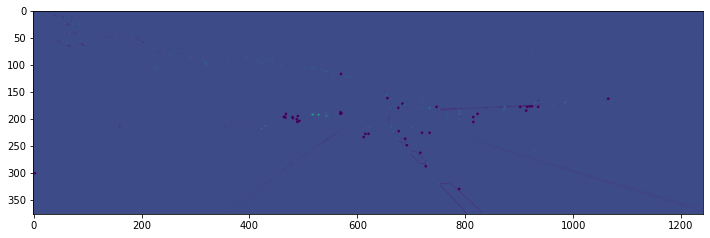

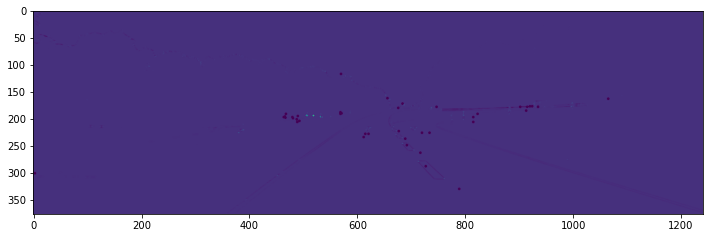

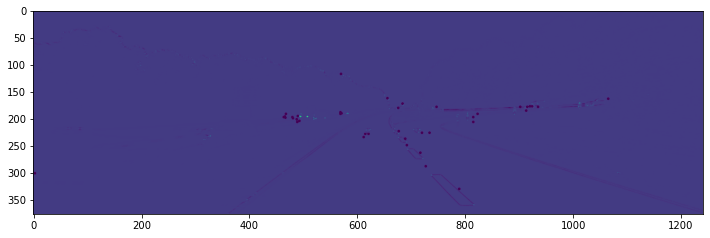

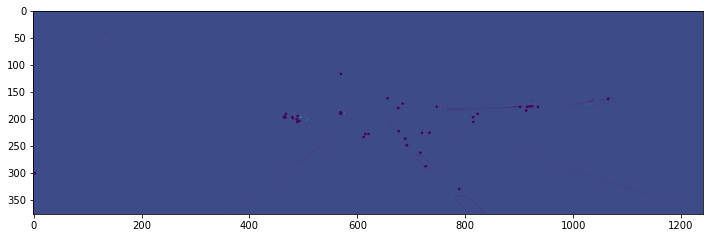

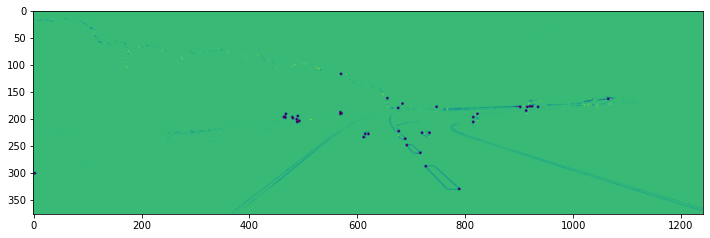

In [23]:
for i in range(100,150):
    img = cv2.imread('C:/Users/maely/Downloads/data_odometry_gray/dataset/sequences/01/image_0/000'+str(i)+'.png')
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) 
    dst = cv2.cornerHarris(img, blockSize, apertureSize, a)
    imagFilter = norm2(dst)
    pick = non_max(np.array(dst_boxes), 0.3)
    imagFilter = pickBoxes(pick, imagFilter)
    plt.figure(figsize=(12,6))
    plt.imshow(imagFilter)

C:\Users\maely\AppData\Local\Temp/ipykernel_11180/293719125.py:17: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(12,6))


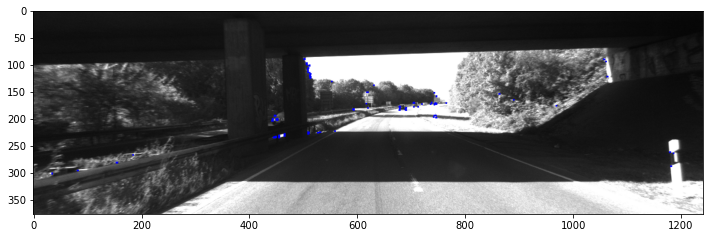

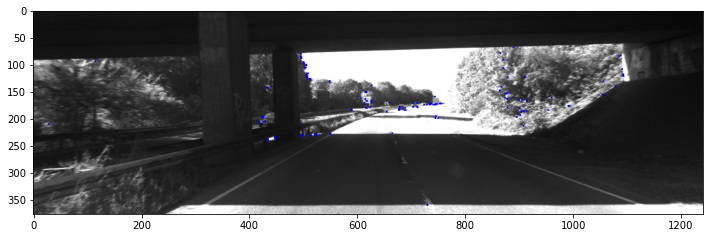

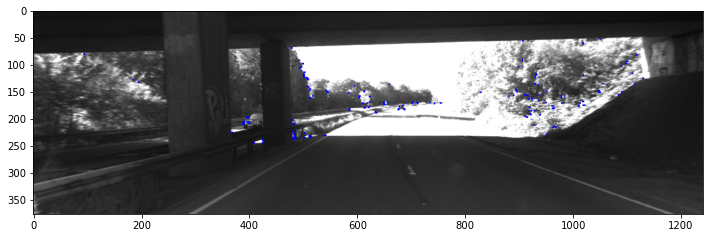

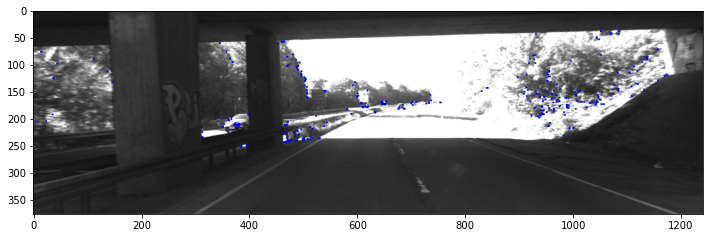

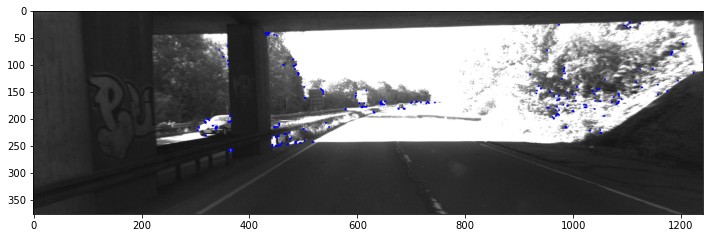

...

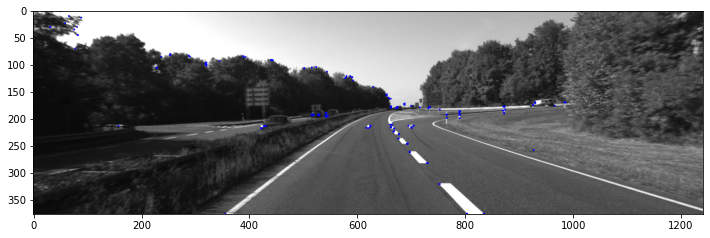

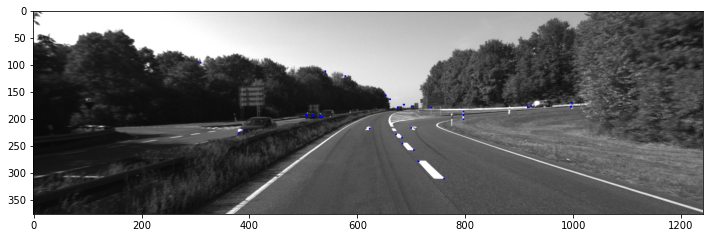

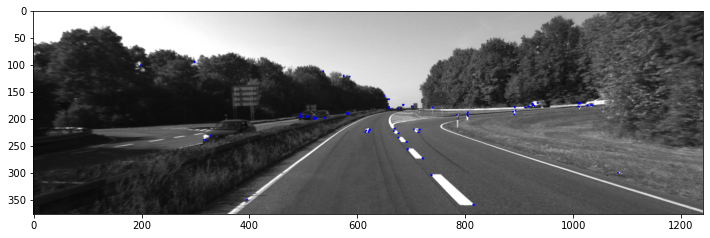

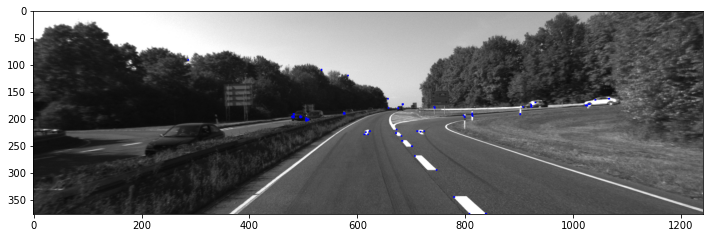

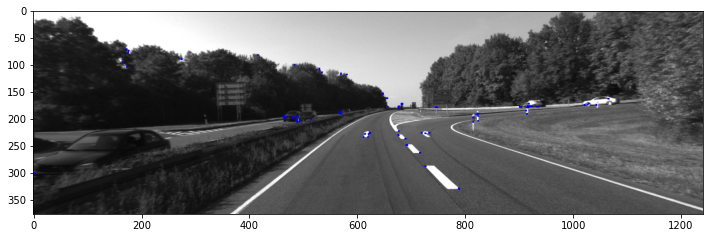

In [62]:
import cv2
# Read the image and convert it to a grayscale
for i in range(100,150):
    image = cv2.imread('C:/Users/maely/Downloads/data_odometry_gray/dataset/sequences/01/image_0/000'+str(i)+'.png')

    gray  = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
# Detect corner
    output = cv2.cornerHarris(gray,2,3,0.04)
# Results are marked through the dilated corners
# cv2.dilate dilates an image by using a specific structuring element.
# It is used to increases the object area and to emphasize features
    output = cv2.dilate(output,None)
# Threshold and place red dots at detection points
    image[output>0.1*output.max()]=[0,0,255]
#     dst_boxes=[]
#     image = norm(dst,dst_boxes)
    plt.figure(figsize=(12,6))
    plt.imshow(image)

In [77]:
# # Se tivermos mais de 100 features em cada bucket => QuickSelect

# def partition(arr, l, r):

#     x = arr[r]
#     i = l
#     for j in range(l, r):

#         if arr[j] <= x:
#             arr[i], arr[j] = arr[j], arr[i]
#             i += 1

#     arr[i], arr[r] = arr[r], arr[i]
#     return i

# def kthSmallest(arr, l, r, k):


#     if (k > 0 and k <= r - l + 1):


#     index = partition(arr, l, r)


#     if (index - l == k - 1):
#         return arr[index]


#         if (index - l > k - 1):
#             return kthSmallest(arr, l, index - 1, k)


#         return kthSmallest(arr, index + 1, r,
#                             k - index + l - 1)
#     print("Index out of bound")

# # Driver Code
# arr = [ 10, 4, 5, 8, 6, 11, 26 ]
# n = len(arr)
# k = 3
# print("K-th smallest element is ", end = "")
# print(kthSmallest(arr, 0, n - 1, k))




In [46]:
import os
import numpy as np
import cv2
from lib.visualization import plotting
from lib.visualization.video import play_trip
from tqdm import tqdm

In [61]:

def harris(img):
    gray_img = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    gray_img = np.float32(gray_img)
    dst = cv2.cornerHarris(gray_img, 2, 3, 0.04)
    result_img = img.copy() 
    result_img[dst > 0.01 * dst.max()] = [0, 0, 255]
    keypoints = np.argwhere(dst > 0.01 * dst.max())
    keypoints = [cv2.KeyPoint(float(x[1]), float(x[0]), 13) for x in keypoints]
    return (keypoints, result_img)

In [ ]:
#Com Harris Corners

In [57]:

class VisualOdometry():
    def __init__(self, data_dir):
        self.K, self.P = self._load_calib(os.path.join(data_dir, 'calib.txt'))
        self.gt_poses = self._load_poses(os.path.join(data_dir,"poses.txt"))
        self.images = self._load_images(os.path.join(data_dir,"image_l"))
        self.orb = cv2.ORB_create(3000)
        FLANN_INDEX_LSH = 6
        index_params = dict(algorithm=FLANN_INDEX_LSH, table_number=6, key_size=12, multi_probe_level=1)
        search_params = dict(checks=50)
        self.flann = cv2.FlannBasedMatcher(indexParams=index_params, searchParams=search_params)

    @staticmethod
    def _load_calib(filepath):
        """
        Loads the calibration of the camera
        Parameters
        ----------
        filepath (str): The file path to the camera file

        Returns
        -------
        K (ndarray): Intrinsic parameters
        P (ndarray): Projection matrix
        """
        with open(filepath, 'r') as f:
            params = np.fromstring(f.readline(), dtype=np.float64, sep=' ')
            P = np.reshape(params, (3, 4))
            K = P[0:3, 0:3]
        return K, P

    @staticmethod
    def _load_poses(filepath):
        """
        Loads the GT poses

        Parameters
        ----------
        filepath (str): The file path to the poses file

        Returns
        -------
        poses (ndarray): The GT poses
        """
        poses = []
        with open(filepath, 'r') as f:
            for line in f.readlines():
                T = np.fromstring(line, dtype=np.float64, sep=' ')
                T = T.reshape(3, 4)
                T = np.vstack((T, [0, 0, 0, 1]))
                poses.append(T)
        return poses

    @staticmethod
    def _load_images(filepath):
        """
        Loads the images

        Parameters
        ----------
        filepath (str): The file path to image dir

        Returns
        -------
        images (list): grayscale images
        """
        image_paths = [os.path.join(filepath, file) for file in sorted(os.listdir(filepath))]
        return [cv2.imread(path, cv2.IMREAD_GRAYSCALE) for path in image_paths]

    @staticmethod
    def _form_transf(R, t):
        """
        Makes a transformation matrix from the given rotation matrix and translation vector

        Parameters
        ----------
        R (ndarray): The rotation matrix
        t (list): The translation vector

        Returns
        -------
        T (ndarray): The transformation matrix
        """
        T = np.eye(4, dtype=np.float64)
        T[:3, :3] = R
        T[:3, 3] = t
        return T

    def get_matches(self, i, algo='orb'):
        """
        This function detect and compute keypoints and descriptors from the i-1'th and i'th image using the class orb object

        Parameters
        ----------
        i (int): The current frame

        Returns
        -------
        q1 (ndarray): The good keypoints matches position in i-1'th image
        q2 (ndarray): The good keypoints matches position in i'th image
        """
        # Find the keypoints and descriptors with ORB
        if algo=='orb':
            kp1, des1 = self.orb.detectAndCompute(self.images[i - 1], None)
            kp2, des2 = self.orb.detectAndCompute(self.images[i], None)
        elif algo=='harris':
            
            
            kp1, result1 = harris(cv2.cvtColor(self.images[i - 1],cv2.COLOR_GRAY2RGB))
            kp1, des1 = self.orb.compute(result1,kp1)
            
            
            
            kp2, result2 = harris(cv2.cvtColor(self.images[i],cv2.COLOR_GRAY2RGB))
            kp2, des2 = self.orb.compute(result2,kp2)
            
            
           
        # Find matches
        matches = self.flann.knnMatch(des1, des2, k=2)

        # Find the matches there do not have a to high distance
        good = []
        try:
            for m, n in matches:
                if m.distance < 0.8 * n.distance:
                    good.append(m)
        except ValueError:
            pass

        draw_params = dict(matchColor = -1, # draw matches in green color
                 singlePointColor = None,
                 matchesMask = None, # draw only inliers
                 flags = 2)

        img3 = cv2.drawMatches(self.images[i], kp1, self.images[i-1],kp2, good ,None,**draw_params)
        cv2.imshow("image", img3)
        cv2.waitKey(200)

        # Get the image points form the good matches
        q1 = np.float32([kp1[m.queryIdx].pt for m in good])
        q2 = np.float32([kp2[m.trainIdx].pt for m in good])
        return q1, q2

    def get_pose(self, q1, q2):
        """
        Calculates the transformation matrix

        Parameters
        ----------
        q1 (ndarray): The good keypoints matches position in i-1'th image
        q2 (ndarray): The good keypoints matches position in i'th image

        Returns
        -------
        transformation_matrix (ndarray): The transformation matrix
        """
        # Essential matrix
        E, _ = cv2.findEssentialMat(q1, q2, self.K, threshold=1)

        # Decompose the Essential matrix into R and t
        R, t = self.decomp_essential_mat(E, q1, q2)

        # Get transformation matrix
        transformation_matrix = self._form_transf(R, np.squeeze(t))
        return transformation_matrix

    def decomp_essential_mat(self, E, q1, q2):
        """
        Decompose the Essential matrix

        Parameters
        ----------
        E (ndarray): Essential matrix
        q1 (ndarray): The good keypoints matches position in i-1'th image
        q2 (ndarray): The good keypoints matches position in i'th image

        Returns
        -------
        right_pair (list): Contains the rotation matrix and translation vector
        """
        def sum_z_cal_relative_scale(R, t):
            # Get the transformation matrix
            T = self._form_transf(R, t)
            # Make the projection matrix
            P = np.matmul(np.concatenate((self.K, np.zeros((3, 1))), axis=1), T)

            # Triangulate the 3D points
            hom_Q1 = cv2.triangulatePoints(self.P, P, q1.T, q2.T)
            # Also seen from cam 2
            hom_Q2 = np.matmul(T, hom_Q1)

            # Un-homogenize
            uhom_Q1 = hom_Q1[:3, :] / hom_Q1[3, :]
            uhom_Q2 = hom_Q2[:3, :] / hom_Q2[3, :]

            # Find the number of points there has positive z coordinate in both cameras
            sum_of_pos_z_Q1 = sum(uhom_Q1[2, :] > 0)
            sum_of_pos_z_Q2 = sum(uhom_Q2[2, :] > 0)

            # Form point pairs and calculate the relative scale
            relative_scale = np.mean(np.linalg.norm(uhom_Q1.T[:-1] - uhom_Q1.T[1:], axis=-1)/
                                     np.linalg.norm(uhom_Q2.T[:-1] - uhom_Q2.T[1:], axis=-1))
            return sum_of_pos_z_Q1 + sum_of_pos_z_Q2, relative_scale

        # Decompose the essential matrix
        R1, R2, t = cv2.decomposeEssentialMat(E)
        t = np.squeeze(t)

        # Make a list of the different possible pairs
        pairs = [[R1, t], [R1, -t], [R2, t], [R2, -t]]

        # Check which solution there is the right one
        z_sums = []
        relative_scales = []
        for R, t in pairs:
            z_sum, scale = sum_z_cal_relative_scale(R, t)
            z_sums.append(z_sum)
            relative_scales.append(scale)

        # Select the pair there has the most points with positive z coordinate
        right_pair_idx = np.argmax(z_sums)
        right_pair = pairs[right_pair_idx]
        relative_scale = relative_scales[right_pair_idx]
        R1, t = right_pair
        t = t * relative_scale

        return [R1, t]


def main(algo):
    data_dir = "KITTI_sequence_2"  # Try KITTI_sequence_2 too
    vo = VisualOdometry(data_dir)

    play_trip(vo.images)  # Comment out to not play the trip

    gt_path = []
    estimated_path = []
    for i, gt_pose in enumerate(tqdm(vo.gt_poses, unit="pose")):
        if i == 0:
            cur_pose = gt_pose
        else:
            q1, q2 = vo.get_matches(i, algo)
            transf = vo.get_pose(q1, q2)
            cur_pose = np.matmul(cur_pose, np.linalg.inv(transf))
        gt_path.append((gt_pose[0, 3], gt_pose[2, 3]))
        estimated_path.append((cur_pose[0, 3], cur_pose[2, 3]))
    plotting.visualize_paths(gt_path, estimated_path, "Visual Odometry", file_out=os.path.basename(data_dir) + ".html")



In [64]:
main('harris')

100%|██████████████████████████████████████████████████████████████████████████████| 150/150 [00:49<00:00,  3.00pose/s]


In [67]:
import os
import numpy as np
import cv2
from scipy.optimize import least_squares

from lib.visualization import plotting
from lib.visualization.video import play_trip

from tqdm import tqdm

#Stereo

class VisualOdometry():
    def __init__(self, data_dir):
        self.K_l, self.P_l, self.K_r, self.P_r = self._load_calib(data_dir + '/calib.txt')
        self.gt_poses = self._load_poses(data_dir + '/poses.txt')
        self.images_l = self._load_images(data_dir + '/image_l')
        self.images_r = self._load_images(data_dir + '/image_r')

        block = 11
        P1 = block * block * 8
        P2 = block * block * 32
        self.disparity = cv2.StereoSGBM_create(minDisparity=0, numDisparities=32, blockSize=block, P1=P1, P2=P2)
        self.disparities = [
            np.divide(self.disparity.compute(self.images_l[0], self.images_r[0]).astype(np.float32), 16)]
        self.fastFeatures = cv2.FastFeatureDetector_create()

        self.lk_params = dict(winSize=(15, 15),
                              flags=cv2.MOTION_AFFINE,
                              maxLevel=3,
                              criteria=(cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 50, 0.03))

    @staticmethod
    def _load_calib(filepath):
        """
        Loads the calibration of the camera
        Parameters
        ----------
        filepath (str): The file path to the camera file
        Returns
        -------
        K_l (ndarray): Intrinsic parameters for left camera. Shape (3,3)
        P_l (ndarray): Projection matrix for left camera. Shape (3,4)
        K_r (ndarray): Intrinsic parameters for right camera. Shape (3,3)
        P_r (ndarray): Projection matrix for right camera. Shape (3,4)
        """
        with open(filepath, 'r') as f:
            params = np.fromstring(f.readline(), dtype=np.float64, sep=' ')
            P_l = np.reshape(params, (3, 4))
            K_l = P_l[0:3, 0:3]
            params = np.fromstring(f.readline(), dtype=np.float64, sep=' ')
            P_r = np.reshape(params, (3, 4))
            K_r = P_r[0:3, 0:3]
        return K_l, P_l, K_r, P_r

    @staticmethod
    def _load_poses(filepath):
        """
        Loads the GT poses
        Parameters
        ----------
        filepath (str): The file path to the poses file
        Returns
        -------
        poses (ndarray): The GT poses. Shape (n, 4, 4)
        """
        poses = []
        with open(filepath, 'r') as f:
            for line in f.readlines():
                T = np.fromstring(line, dtype=np.float64, sep=' ')
                T = T.reshape(3, 4)
                T = np.vstack((T, [0, 0, 0, 1]))
                poses.append(T)
        return poses

    @staticmethod
    def _load_images(filepath):
        """
        Loads the images
        Parameters
        ----------
        filepath (str): The file path to image dir
        Returns
        -------
        images (list): grayscale images. Shape (n, height, width)
        """
        image_paths = [os.path.join(filepath, file) for file in sorted(os.listdir(filepath))]
        images = [cv2.imread(path, cv2.IMREAD_GRAYSCALE) for path in image_paths]
        return images

    @staticmethod
    def _form_transf(R, t):
        """
        Makes a transformation matrix from the given rotation matrix and translation vector
        Parameters
        ----------
        R (ndarray): The rotation matrix. Shape (3,3)
        t (list): The translation vector. Shape (3)
        Returns
        -------
        T (ndarray): The transformation matrix. Shape (4,4)
        """
        T = np.eye(4, dtype=np.float64)
        T[:3, :3] = R
        T[:3, 3] = t
        return T

    def reprojection_residuals(self, dof, q1, q2, Q1, Q2):
        """
        Calculate the residuals
        Parameters
        ----------
        dof (ndarray): Transformation between the two frames. First 3 elements are the rotation vector and the last 3 is the translation. Shape (6)
        q1 (ndarray): Feature points in i-1'th image. Shape (n_points, 2)
        q2 (ndarray): Feature points in i'th image. Shape (n_points, 2)
        Q1 (ndarray): 3D points seen from the i-1'th image. Shape (n_points, 3)
        Q2 (ndarray): 3D points seen from the i'th image. Shape (n_points, 3)
        Returns
        -------
        residuals (ndarray): The residuals. In shape (2 * n_points * 2)
        """
        # Get the rotation vector
        r = dof[:3]
        # Create the rotation matrix from the rotation vector
        R, _ = cv2.Rodrigues(r)
        # Get the translation vector
        t = dof[3:]
        # Create the transformation matrix from the rotation matrix and translation vector
        transf = self._form_transf(R, t)

        # Create the projection matrix for the i-1'th image and i'th image
        f_projection = np.matmul(self.P_l, transf)
        b_projection = np.matmul(self.P_l, np.linalg.inv(transf))

        # Make the 3D points homogenize
        ones = np.ones((q1.shape[0], 1))
        Q1 = np.hstack([Q1, ones])
        Q2 = np.hstack([Q2, ones])

        # Project 3D points from i'th image to i-1'th image
        q1_pred = Q2.dot(f_projection.T)
        # Un-homogenize
        q1_pred = q1_pred[:, :2].T / q1_pred[:, 2]

        # Project 3D points from i-1'th image to i'th image
        q2_pred = Q1.dot(b_projection.T)
        # Un-homogenize
        q2_pred = q2_pred[:, :2].T / q2_pred[:, 2]

        # Calculate the residuals
        residuals = np.vstack([q1_pred - q1.T, q2_pred - q2.T]).flatten()
        return residuals

    def get_tiled_keypoints(self, img, tile_h, tile_w):
        """
        Splits the image into tiles and detects the 10 best keypoints in each tile
        Parameters
        ----------
        img (ndarray): The image to find keypoints in. Shape (height, width)
        tile_h (int): The tile height
        tile_w (int): The tile width
        Returns
        -------
        kp_list (ndarray): A 1-D list of all keypoints. Shape (n_keypoints)
        """
        def get_kps(x, y):
            # Get the image tile
            impatch = img[y:y + tile_h, x:x + tile_w]

            # Detect keypoints
            keypoints = self.fastFeatures.detect(impatch)

            # Correct the coordinate for the point
            for pt in keypoints:
                pt.pt = (pt.pt[0] + x, pt.pt[1] + y)

            # Get the 10 best keypoints
            if len(keypoints) > 10:
                keypoints = sorted(keypoints, key=lambda x: -x.response)
                return keypoints[:10]
            return keypoints
        # Get the image height and width
        h, w, *_ = img.shape

        # Get the keypoints for each of the tiles
        kp_list = [get_kps(x, y) for y in range(0, h, tile_h) for x in range(0, w, tile_w)]

        # Flatten the keypoint list
        kp_list_flatten = np.concatenate(kp_list)
        return kp_list_flatten

    def track_keypoints(self, img1, img2, kp1, max_error=4):
        """
        Tracks the keypoints between frames
        Parameters
        ----------
        img1 (ndarray): i-1'th image. Shape (height, width)
        img2 (ndarray): i'th image. Shape (height, width)
        kp1 (ndarray): Keypoints in the i-1'th image. Shape (n_keypoints)
        max_error (float): The maximum acceptable error
        Returns
        -------
        trackpoints1 (ndarray): The tracked keypoints for the i-1'th image. Shape (n_keypoints_match, 2)
        trackpoints2 (ndarray): The tracked keypoints for the i'th image. Shape (n_keypoints_match, 2)
        """
        # Convert the keypoints into a vector of points and expand the dims so we can select the good ones
        trackpoints1 = np.expand_dims(cv2.KeyPoint_convert(kp1), axis=1)

        # Use optical flow to find tracked counterparts
        trackpoints2, st, err = cv2.calcOpticalFlowPyrLK(img1, img2, trackpoints1, None, **self.lk_params)

        # Convert the status vector to boolean so we can use it as a mask
        trackable = st.astype(bool)

        # Create a maks there selects the keypoints there was trackable and under the max error
        under_thresh = np.where(err[trackable] < max_error, True, False)

        # Use the mask to select the keypoints
        trackpoints1 = trackpoints1[trackable][under_thresh]
        trackpoints2 = np.around(trackpoints2[trackable][under_thresh])

        # Remove the keypoints there is outside the image
        h, w = img1.shape
        in_bounds = np.where(np.logical_and(trackpoints2[:, 1] < h, trackpoints2[:, 0] < w), True, False)
        trackpoints1 = trackpoints1[in_bounds]
        trackpoints2 = trackpoints2[in_bounds]

        return trackpoints1, trackpoints2

    def calculate_right_qs(self, q1, q2, disp1, disp2, min_disp=0.0, max_disp=100.0):
        """
        Calculates the right keypoints (feature points)
        Parameters
        ----------
        q1 (ndarray): Feature points in i-1'th left image. In shape (n_points, 2)
        q2 (ndarray): Feature points in i'th left image. In shape (n_points, 2)
        disp1 (ndarray): Disparity i-1'th image per. Shape (height, width)
        disp2 (ndarray): Disparity i'th image per. Shape (height, width)
        min_disp (float): The minimum disparity
        max_disp (float): The maximum disparity
        Returns
        -------
        q1_l (ndarray): Feature points in i-1'th left image. In shape (n_in_bounds, 2)
        q1_r (ndarray): Feature points in i-1'th right image. In shape (n_in_bounds, 2)
        q2_l (ndarray): Feature points in i'th left image. In shape (n_in_bounds, 2)
        q2_r (ndarray): Feature points in i'th right image. In shape (n_in_bounds, 2)
        """
        def get_idxs(q, disp):
            q_idx = q.astype(int)
            disp = disp.T[q_idx[:, 0], q_idx[:, 1]]
            return disp, np.where(np.logical_and(min_disp < disp, disp < max_disp), True, False)
        
        # Get the disparity's for the feature points and mask for min_disp & max_disp
        disp1, mask1 = get_idxs(q1, disp1)
        disp2, mask2 = get_idxs(q2, disp2)
        
        # Combine the masks 
        in_bounds = np.logical_and(mask1, mask2)
        
        # Get the feature points and disparity's there was in bounds
        q1_l, q2_l, disp1, disp2 = q1[in_bounds], q2[in_bounds], disp1[in_bounds], disp2[in_bounds]
        
        # Calculate the right feature points 
        q1_r, q2_r = np.copy(q1_l), np.copy(q2_l)
        q1_r[:, 0] -= disp1
        q2_r[:, 0] -= disp2
        
        return q1_l, q1_r, q2_l, q2_r

    def calc_3d(self, q1_l, q1_r, q2_l, q2_r):
        """
        Triangulate points from both images 
        
        Parameters
        ----------
        q1_l (ndarray): Feature points in i-1'th left image. In shape (n, 2)
        q1_r (ndarray): Feature points in i-1'th right image. In shape (n, 2)
        q2_l (ndarray): Feature points in i'th left image. In shape (n, 2)
        q2_r (ndarray): Feature points in i'th right image. In shape (n, 2)
        Returns
        -------
        Q1 (ndarray): 3D points seen from the i-1'th image. In shape (n, 3)
        Q2 (ndarray): 3D points seen from the i'th image. In shape (n, 3)
        """
        # Triangulate points from i-1'th image
        Q1 = cv2.triangulatePoints(self.P_l, self.P_r, q1_l.T, q1_r.T)
        # Un-homogenize
        Q1 = np.transpose(Q1[:3] / Q1[3])

        # Triangulate points from i'th image
        Q2 = cv2.triangulatePoints(self.P_l, self.P_r, q2_l.T, q2_r.T)
        # Un-homogenize
        Q2 = np.transpose(Q2[:3] / Q2[3])
        return Q1, Q2

    def estimate_pose(self, q1, q2, Q1, Q2, max_iter=100):
        """
        Estimates the transformation matrix
        Parameters
        ----------
        q1 (ndarray): Feature points in i-1'th image. Shape (n, 2)
        q2 (ndarray): Feature points in i'th image. Shape (n, 2)
        Q1 (ndarray): 3D points seen from the i-1'th image. Shape (n, 3)
        Q2 (ndarray): 3D points seen from the i'th image. Shape (n, 3)
        max_iter (int): The maximum number of iterations
        Returns
        -------
        transformation_matrix (ndarray): The transformation matrix. Shape (4,4)
        """
        early_termination_threshold = 5

        # Initialize the min_error and early_termination counter
        min_error = float('inf')
        early_termination = 0

        for _ in range(max_iter):
            # Choose 6 random feature points
            sample_idx = np.random.choice(range(q1.shape[0]), 6)
            sample_q1, sample_q2, sample_Q1, sample_Q2 = q1[sample_idx], q2[sample_idx], Q1[sample_idx], Q2[sample_idx]

            # Make the start guess
            in_guess = np.zeros(6)
            # Perform least squares optimization
            opt_res = least_squares(self.reprojection_residuals, in_guess, method='lm', max_nfev=200,
                                    args=(sample_q1, sample_q2, sample_Q1, sample_Q2))

            # Calculate the error for the optimized transformation
            error = self.reprojection_residuals(opt_res.x, q1, q2, Q1, Q2)
            error = error.reshape((Q1.shape[0] * 2, 2))
            error = np.sum(np.linalg.norm(error, axis=1))

            # Check if the error is less the the current min error. Save the result if it is
            if error < min_error:
                min_error = error
                out_pose = opt_res.x
                early_termination = 0
            else:
                early_termination += 1
            if early_termination == early_termination_threshold:
                # If we have not fund any better result in early_termination_threshold iterations
                break

        # Get the rotation vector
        r = out_pose[:3]
        # Make the rotation matrix
        R, _ = cv2.Rodrigues(r)
        # Get the translation vector
        t = out_pose[3:]
        # Make the transformation matrix
        transformation_matrix = self._form_transf(R, t)
        return transformation_matrix

    def get_pose(self, i):
        """
        Calculates the transformation matrix for the i'th frame
        Parameters
        ----------
        i (int): Frame index
        Returns
        -------
        transformation_matrix (ndarray): The transformation matrix. Shape (4,4)
        """
        # Get the i-1'th image and i'th image
        img1_l, img2_l = self.images_l[i - 1:i + 1]

        # Get teh tiled keypoints
        kp1_l = self.get_tiled_keypoints(img1_l, 10, 20)

        # Track the keypoints
        tp1_l, tp2_l = self.track_keypoints(img1_l, img2_l, kp1_l)

        # Calculate the disparitie
        self.disparities.append(np.divide(self.disparity.compute(img2_l, self.images_r[i]).astype(np.float32), 16))

        # Calculate the right keypoints
        tp1_l, tp1_r, tp2_l, tp2_r = self.calculate_right_qs(tp1_l, tp2_l, self.disparities[i - 1], self.disparities[i])

        # Calculate the 3D points
        Q1, Q2 = self.calc_3d(tp1_l, tp1_r, tp2_l, tp2_r)

        # Estimate the transformation matrix
        transformation_matrix = self.estimate_pose(tp1_l, tp2_l, Q1, Q2)
        return transformation_matrix


def main():
    data_dir = 'KITTI_sequence_2'  # Try KITTI_sequence_2
    vo = VisualOdometry(data_dir)

    play_trip(vo.images_l, vo.images_r)  # Comment out to not play the trip

    gt_path = []
    estimated_path = []
    for i, gt_pose in enumerate(tqdm(vo.gt_poses, unit="poses")):
        if i < 1:
            cur_pose = gt_pose
        else:
            transf = vo.get_pose(i)
            cur_pose = np.matmul(cur_pose, transf)
        gt_path.append((gt_pose[0, 3], gt_pose[2, 3]))
        estimated_path.append((cur_pose[0, 3], cur_pose[2, 3]))
    plotting.visualize_paths(gt_path, estimated_path, "Stereo Visual Odometry",
                             file_out=os.path.basename(data_dir) + ".html")


In [68]:
main()

100%|█████████████████████████████████████████████████████████████████████████████| 150/150 [00:18<00:00,  8.06poses/s]
